In [1]:
import cv2
from pathlib import Path
from random import *
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
np.random.seed(1000)

In [2]:
physical_devices = tf.config.experimental.list_physical_devices('GPU')
if len(physical_devices) > 0:
   tf.config.experimental.set_memory_growth(physical_devices[0], True)

In [3]:
result = list(file.absolute().as_posix() for file in list(Path("C:/Users/Moh.Massoud/Desktop/face mask dataset/data/test1").rglob("*.[jJ][pP][gG]") ) )
test_images = []
#print(result[0][:64][-1])
for img_path in result:
    img = cv2.imread(img_path)
    resized = cv2.resize(img, (224,224))
    test_images.append(resized)
test_images = np.asanyarray(test_images)
test_labels = np.asanyarray(list(1 if name[:64][-1] == '_' else 0 for name in result))
#test_images = np.expand_dims(test_images, axis=3)

In [4]:
result = list(file.absolute().as_posix() for file in list(Path("C:/Users/Moh.Massoud/Desktop/face mask dataset/data/train").rglob("*.[jJ][pP][gG]") ) )
train_images = []
#print(result[0][:64][-1])
for img_path in result:
    img = cv2.imread(img_path)
    resized = cv2.resize(img, (224,224))
    train_images.append(resized)
train_images = np.asanyarray(train_images)
train_labels = np.asanyarray(list(1 if name[:64][-1] == '_' else 0 for name in result))
#train_images = np.expand_dims(train_images, axis=3)

In [5]:
model = keras.applications.MobileNet()

In [6]:
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [7]:
model.fit(train_images, train_labels, epochs=1)

Train on 6828 samples
6828/6828 [==============================] - 33s 5ms/sample - loss: 0.1891 - accuracy: 0.9711


In [8]:
test_loss, test_acc = model.evaluate(test_images,  test_labels, verbose=2)

1453/1453 - 2s - loss: 0.0228 - accuracy: 0.9938


In [9]:
model.save('mask_detector.h5')

In [10]:
def plot_image(i, predictions_array, true_label, img):
  predictions_array, true_label, img = predictions_array, true_label[i], img[i]
  #plt.grid(False)
  plt.xticks([])
  plt.yticks([])
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  plt.imshow(img, cmap=plt.cm.binary)

  predicted_label = np.argmax(predictions_array)
  if predicted_label == true_label:
    color = 'blue'
  else:
    color = 'red'

  plt.xlabel("{} {:2.0f}% ({})".format(predicted_label,
                                100*np.max(predictions_array),
                                true_label),
                                color=color)



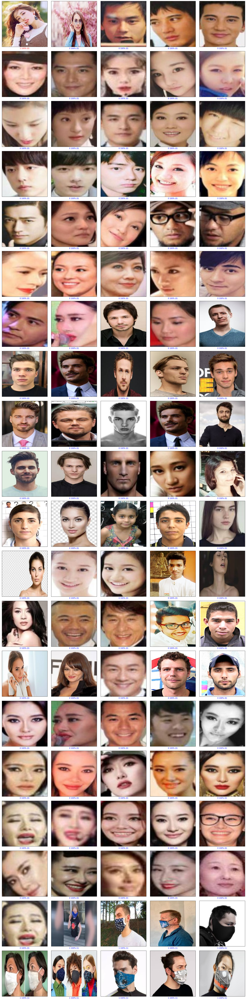

In [11]:
num_rows = 20
num_cols = 5
num_images = num_rows*num_cols
predictions = model.predict(test_images)
plt.figure(figsize=(2*2*num_cols, 2*2*num_rows), facecolor='white')
for i in range(num_images):
  plt.subplot(num_rows, num_cols, i+1)
  plot_image(i, predictions[i], test_labels, test_images)
plt.tight_layout()
plt.show()